In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("climate_change_impact_on_agriculture_2024.csv")
df

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2022,France,Nouvelle-Aquitaine,Cotton,30.48,685.93,17.64,3.033,9,27.56,41.96,10.95,43.41,No Adaptation,1483.06
9996,1999,Australia,Queensland,Soybeans,9.53,2560.38,10.68,2.560,4,77.02,5.45,82.32,59.39,No Adaptation,829.61
9997,2000,Argentina,Patagonia,Coffee,31.92,357.76,26.01,1.161,10,78.53,11.94,26.00,41.46,Water Management,155.99
9998,1996,Brazil,Southeast,Soybeans,13.95,1549.52,17.31,3.348,2,42.65,44.71,25.07,75.10,Crop Rotation,1613.90


# Data Preprocessing

In [3]:
from sklearn.preprocessing import StandardScaler, LabelEncoder


In [4]:
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

In [5]:
df_clean = df.copy()


## 1) Remove Outliers

In [6]:
for col in numerical_columns:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]

In [7]:
df_cluster = df_clean.copy()
X_processed = df_clean.copy()

## 2) Label Enconding

In [8]:
label_encoders = {}


# Encode categorical features and store encoders
for col in categorical_cols:
    le = LabelEncoder()
    X_processed[col] = le.fit_transform(X_processed[col])
    label_encoders[col] = le



## 3) Feature Scaling

In [9]:
scaler = StandardScaler()
X_processed[numerical_columns] = scaler.fit_transform(X_processed[numerical_columns])

## 4) Feature Selection

In [10]:
X = X_processed.iloc[:, [7, 14]]
X

,Crop_Yield_MT_per_HA,Economic_Impact_Million_USD
0,-0.481912,0.412638
1,-0.481912,-0.092033
2,-0.500495,0.383264
3,1.740775,0.365802
4,-1.160177,-0.656109
...,...,...
9995,0.856036,2.187518
9996,0.367726,0.469124
9997,-1.076555,-1.302311
9998,1.181232,2.531591


## 5) T-SNE to verify cluster

In [11]:
from sklearn.manifold import TSNE


In [12]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_processed)

In [13]:
def plot_tsne(label):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df_cluster[label], palette="Set2")
    plt.title("TSNE Projection")
    plt.xlabel("TSNE 1")
    plt.ylabel("TSNE 2")
    plt.legend(title='Cluster')
    plt.show()

# Modelling + Evaluation

In [14]:
# pip install optuna

In [11]:
import optuna
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import pairwise_distances, pairwise_kernels
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## Function to visualise cluster

In [12]:
def visualise_result(label):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x= df_cluster.iloc[:, 7], y= df_cluster.iloc[:, 14], hue=df_cluster[label], palette="Set2")
    plt.title(f"Crop Yield vs Economic Impact(million USD)")
    plt.xlabel("Crop Yield")
    plt.ylabel("Economic Impact(million USD)")
    plt.legend(title='Cluster')
    plt.show()

In [13]:
def evaluate_cluster(label):
    cluster_labels = df_cluster[label]
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:  
        return print("Only 1 cluster cannot calculate scores!")
    
    print(f"Silhouette Score: {silhouette_score(X, cluster_labels):.4f}")
    print(f"Calinski Harabasz Score: {calinski_harabasz_score(X, cluster_labels):.4f}")
    print(f"Davies_bouldin_score: {davies_bouldin_score(X, cluster_labels):.4f}")

## 1) Gaussian Mixture Model (GMM)

In [16]:
from sklearn.mixture import GaussianMixture

def objectiveGMM(trial):
    #parameter range
    n_components = trial.suggest_int("n_components", 2, 4)
    covariance_type = trial.suggest_categorical("covariance_type", ["spherical", "tied", "diag", "full"])
    
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
    cluster_labels = gmm.fit_predict(X)
    score = silhouette_score(X, cluster_labels)
    
    # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:  # Avoid single cluster issue
        return -1  # Return a low score to avoid selecting this setup
    
    return score

# Run Optuna optimization
#tune based on maximizing silhouette score
studyGMM = optuna.create_study(direction="maximize")
studyGMM.optimize(objectiveGMM, n_trials=15)

# Train the best model
best_params_GMM = studyGMM.best_params
best_gmm = GaussianMixture(**best_params_GMM, random_state=42)
df_cluster['GMM_Cluster'] = best_gmm.fit_predict(X)

print(f"Best GMM Params: {best_params_GMM}")


[I 2025-04-09 23:14:59,751] A new study created in memory with name: no-name-0d133823-60af-4c08-a441-63c10ad7598d
[I 2025-04-09 23:15:01,296] Trial 0 finished with value: 0.34599936564956674 and parameters: {'n_components': 4, 'covariance_type': 'spherical'}. Best is trial 0 with value: 0.34599936564956674.
[I 2025-04-09 23:15:02,810] Trial 1 finished with value: 0.4741301223135885 and parameters: {'n_components': 2, 'covariance_type': 'diag'}. Best is trial 1 with value: 0.4741301223135885.
[I 2025-04-09 23:15:04,283] Trial 2 finished with value: 0.26915701165175915 and parameters: {'n_components': 4, 'covariance_type': 'full'}. Best is trial 1 with value: 0.4741301223135885.
[I 2025-04-09 23:15:05,727] Trial 3 finished with value: 0.40103419169277543 and parameters: {'n_components': 4, 'covariance_type': 'tied'}. Best is trial 1 with value: 0.4741301223135885.
[I 2025-04-09 23:15:07,244] Trial 4 finished with value: 0.34599936564956674 and parameters: {'n_components': 4, 'covariance_

Best GMM Params: {'n_components': 2, 'covariance_type': 'tied'}


In [17]:
evaluate_cluster("GMM_Cluster")

Silhouette Score: 0.4927
Calinski Harabasz Score: 13252.2509
Davies_bouldin_score: 0.7569


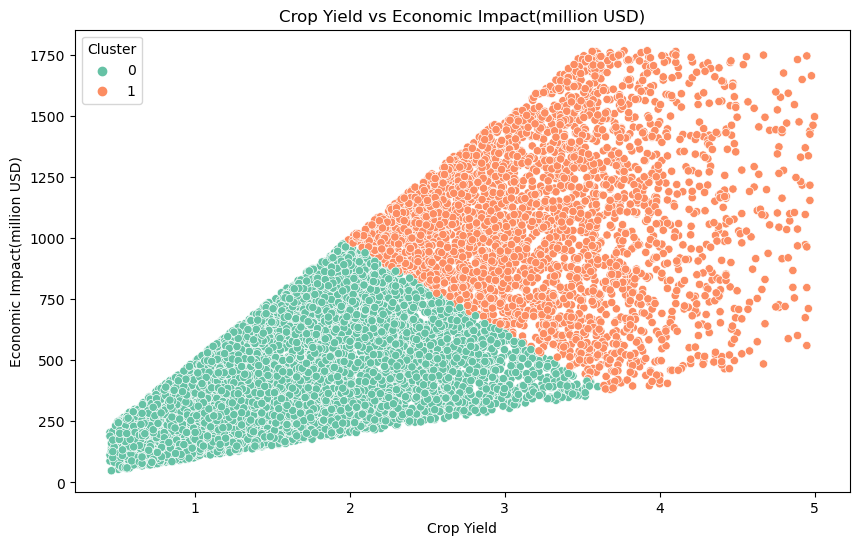

In [18]:
visualise_result("GMM_Cluster")

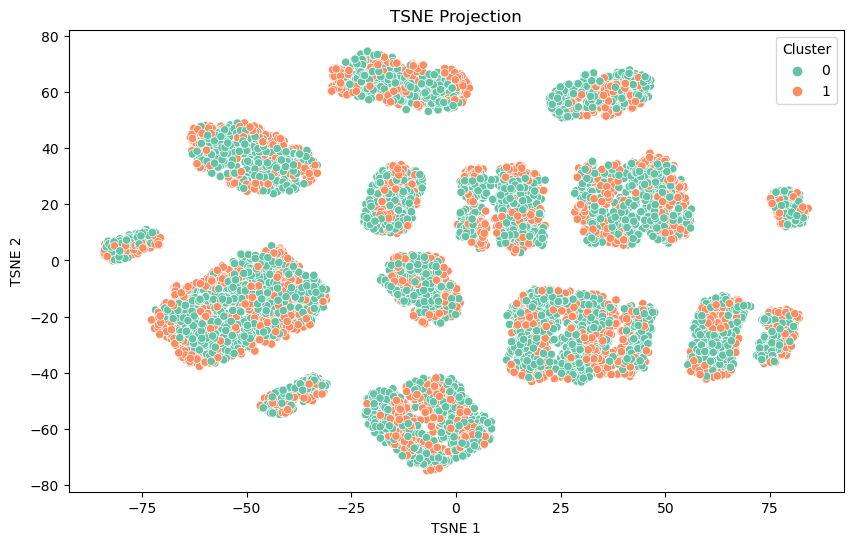

In [21]:
plot_tsne("GMM_Cluster")

## 2) OPTICS

In [22]:
from sklearn.cluster import OPTICS

def objectiveOPTICS(trial):
    #parameter range
    min_samples = trial.suggest_int('min_samples', 2, 5)
    xi = trial.suggest_float('xi', 0.01, 0.5)
    
    optics = OPTICS(min_samples=min_samples, xi=xi)
    cluster_labels = optics.fit_predict(X)
    
    # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:  # Avoid single cluster issue
        return -1  # Return a low score to avoid selecting this setup
    
    return silhouette_score(X, cluster_labels)

#tune based on maximizing silhouette score
studyOPTICS = optuna.create_study(direction="maximize")
studyOPTICS.optimize(objectiveOPTICS, n_trials=10)

# Train the best model
best_params_OPTICS = studyOPTICS.best_params
best_optics = OPTICS(**best_params_OPTICS)
df_cluster['OPTICS_Cluster'] = best_optics.fit_predict(X)

print(f"Best OPTICS Params: {best_params_OPTICS}")

[I 2025-04-09 11:03:11,463] A new study created in memory with name: no-name-a719d319-ebd8-41da-8a8b-ef154650993f
[I 2025-04-09 11:03:22,960] Trial 0 finished with value: -0.22392007616809723 and parameters: {'min_samples': 4, 'xi': 0.10537593851732398}. Best is trial 0 with value: -0.22392007616809723.
[I 2025-04-09 11:03:34,568] Trial 1 finished with value: -0.7284360381440849 and parameters: {'min_samples': 5, 'xi': 0.3483310716947274}. Best is trial 0 with value: -0.22392007616809723.
[I 2025-04-09 11:03:46,063] Trial 2 finished with value: -0.4343002949410853 and parameters: {'min_samples': 4, 'xi': 0.1624502059961801}. Best is trial 0 with value: -0.22392007616809723.
C:\Users\yeoh9\anaconda3\Lib\site-packages\sklearn\cluster\_optics.py:1083: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
[I 2025-04-09 11:03:57,654] Trial 3 finished with value: -0.4534331881644687 and parameters: {'min_samples': 2, 'xi': 0.46152005745

Best OPTICS Params: {'min_samples': 4, 'xi': 0.10537593851732398}


In [23]:
evaluate_cluster('OPTICS_Cluster')

Silhouette Score: -0.2239
Calinski Harabasz Score: 11.4408
Davies_bouldin_score: 1.6340


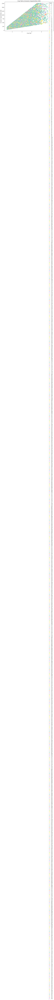

In [24]:
visualise_result('OPTICS_Cluster')

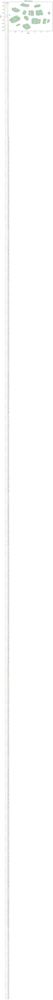

In [25]:
plot_tsne("OPTICS_Cluster")

## 3) HDBSCAN

In [26]:
from sklearn.cluster import HDBSCAN

def objectiveHDBSCAN(trial):
    #parameter range
    min_cluster_size = trial.suggest_int("min_cluster_size", 2, 4)
    min_samples = trial.suggest_int("min_samples", 1, 5)
    
    hdbscan = HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
    cluster_labels = hdbscan.fit_predict(X)
    
     # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:  # Avoid single cluster issue
        return -1  # Return a low score to avoid selecting this setup

    return silhouette_score(X, cluster_labels)


#tune based on maximizing silhouette score
studyHDBSCAN = optuna.create_study(direction="maximize")
studyHDBSCAN.optimize(objectiveHDBSCAN, n_trials=10)

# Train the best model
best_params_HDBSCAN = studyHDBSCAN.best_params
best_hdbscan = HDBSCAN(**best_params_HDBSCAN)
df_cluster['HDBSCAN_Cluster'] = best_hdbscan.fit_predict(X)

print(f"Best HDBSCAN Params: {best_params_HDBSCAN}")

[I 2025-04-09 11:05:53,897] A new study created in memory with name: no-name-ea642763-3835-42e2-b1b0-190b36ece1c8
[I 2025-04-09 11:05:56,471] Trial 0 finished with value: 0.12910224431654083 and parameters: {'min_cluster_size': 2, 'min_samples': 3}. Best is trial 0 with value: 0.12910224431654083.
[I 2025-04-09 11:05:58,881] Trial 1 finished with value: 0.24591862865945174 and parameters: {'min_cluster_size': 3, 'min_samples': 1}. Best is trial 1 with value: 0.24591862865945174.
[I 2025-04-09 11:06:01,270] Trial 2 finished with value: -0.005321883248600624 and parameters: {'min_cluster_size': 4, 'min_samples': 4}. Best is trial 1 with value: 0.24591862865945174.
[I 2025-04-09 11:06:04,327] Trial 3 finished with value: 0.3077645884867095 and parameters: {'min_cluster_size': 2, 'min_samples': 2}. Best is trial 3 with value: 0.3077645884867095.
[I 2025-04-09 11:06:06,672] Trial 4 finished with value: -0.023459878663309466 and parameters: {'min_cluster_size': 2, 'min_samples': 4}. Best is 

Best HDBSCAN Params: {'min_cluster_size': 2, 'min_samples': 2}


In [27]:
evaluate_cluster('HDBSCAN_Cluster')

Silhouette Score: 0.3078
Calinski Harabasz Score: 18.0278
Davies_bouldin_score: 1.8944


In [28]:
visualise_result('HDBSCAN_Cluster')

In [29]:
plot_tsne("HDBSCAN_Cluster")

## 4) Bisecting K Means

In [30]:
from sklearn.cluster import BisectingKMeans
from sklearn.metrics import silhouette_score
import optuna

def objective_bisecting_kmeans(trial):
    # parameter range
    n_clusters = trial.suggest_int("n_clusters", 2, 4)  # Number of final clusters
    bisecting_strategy = trial.suggest_categorical("bisecting_strategy", ["biggest_inertia", "largest_cluster"])  

    # Train Bisecting K-Means
    bkm = BisectingKMeans(n_clusters=n_clusters, bisecting_strategy=bisecting_strategy, random_state=42)
    cluster_labels = bkm.fit_predict(X)

    # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:
        return -1  # Avoid bad configurations

    return silhouette_score(X, cluster_labels)

# Optimize with Optuna
#tune based on maximizing silhouette score
study_bisecting_kmeans = optuna.create_study(direction="maximize")
study_bisecting_kmeans.optimize(objective_bisecting_kmeans, n_trials=10)

# Train the best model
best_params_bisecting_kmeans = study_bisecting_kmeans.best_params
best_bkm = BisectingKMeans(**best_params_bisecting_kmeans, random_state=42)
df_cluster['BKM_Cluster'] = best_bkm.fit_predict(X)

print(f"Best Bisecting K-Means Params: {best_params_bisecting_kmeans}")


[I 2025-04-09 11:08:34,537] A new study created in memory with name: no-name-33bc7627-5488-466d-ac69-9bd142fecd36
[I 2025-04-09 11:08:37,338] Trial 0 finished with value: 0.48844114991524995 and parameters: {'n_clusters': 2, 'bisecting_strategy': 'biggest_inertia'}. Best is trial 0 with value: 0.48844114991524995.
[I 2025-04-09 11:08:38,933] Trial 1 finished with value: 0.48844114991524995 and parameters: {'n_clusters': 2, 'bisecting_strategy': 'largest_cluster'}. Best is trial 0 with value: 0.48844114991524995.
[I 2025-04-09 11:08:40,304] Trial 2 finished with value: 0.35206281889993335 and parameters: {'n_clusters': 3, 'bisecting_strategy': 'largest_cluster'}. Best is trial 0 with value: 0.48844114991524995.
[I 2025-04-09 11:08:41,781] Trial 3 finished with value: 0.4076878480237602 and parameters: {'n_clusters': 3, 'bisecting_strategy': 'biggest_inertia'}. Best is trial 0 with value: 0.48844114991524995.
[I 2025-04-09 11:08:43,293] Trial 4 finished with value: 0.4076878480237602 and

Best Bisecting K-Means Params: {'n_clusters': 2, 'bisecting_strategy': 'biggest_inertia'}


In [31]:
evaluate_cluster('BKM_Cluster')

Silhouette Score: 0.4884
Calinski Harabasz Score: 13862.3218
Davies_bouldin_score: 0.7659


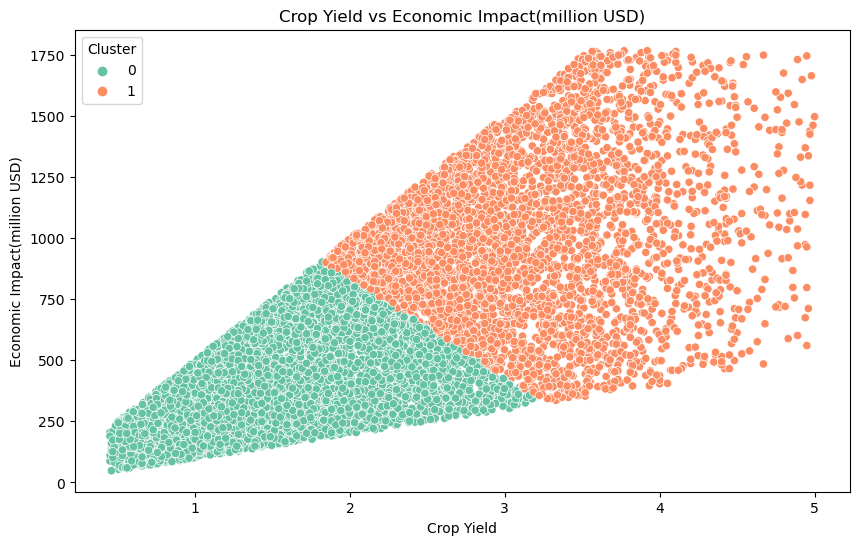

In [32]:
visualise_result('BKM_Cluster')

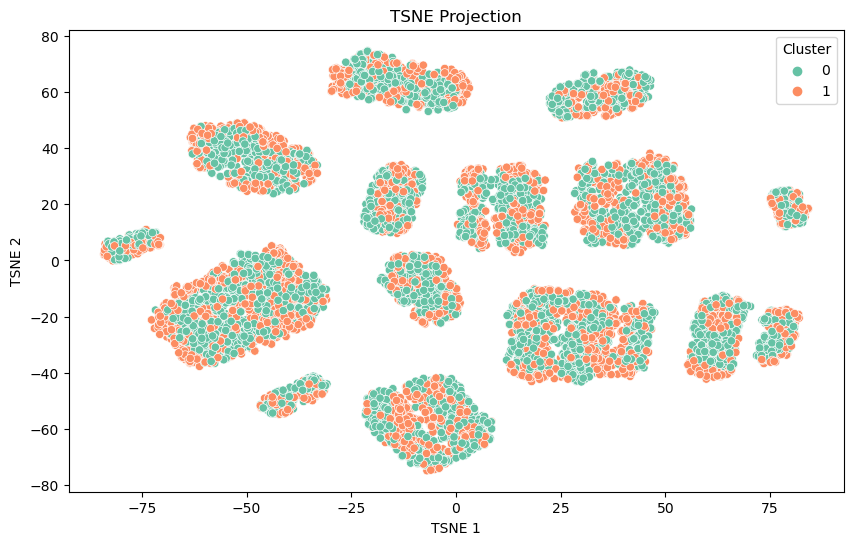

In [33]:
plot_tsne('BKM_Cluster')

## 5) Birch

In [34]:
from sklearn.cluster import Birch

def objective_birch(trial):
    # parameter range
    n_clusters = trial.suggest_int("n_clusters", 2, 5)  # Optimize number of clusters
    threshold = trial.suggest_float("threshold", 0.01, 1.0, log=True)  # Optimize threshold
    
    birch = Birch(n_clusters=n_clusters, threshold=threshold)
    cluster_labels = birch.fit_predict(X)
    
    # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:
        return -1  # Avoid bad configurations

    return silhouette_score(X, cluster_labels)

# Optimize with Optuna
#tune based on maximizing silhouette score
study_birch = optuna.create_study(direction="maximize")
study_birch.optimize(objective_birch, n_trials=10)

# Train the best model
best_params_birch = study_birch.best_params
best_birch = Birch(**best_params_birch)
df_cluster['Birch_Cluster'] = best_birch.fit_predict(X)

print(f"Best Birch Clustering Params: {best_params_birch}")


[I 2025-04-09 11:08:53,462] A new study created in memory with name: no-name-a53464b6-3ab0-4e19-84de-13d5e57b0ad8
[I 2025-04-09 11:08:55,247] Trial 0 finished with value: 0.38900751903756187 and parameters: {'n_clusters': 3, 'threshold': 0.06288733630306188}. Best is trial 0 with value: 0.38900751903756187.
[I 2025-04-09 11:08:57,154] Trial 1 finished with value: 0.43287205492043745 and parameters: {'n_clusters': 2, 'threshold': 0.18136861744655308}. Best is trial 1 with value: 0.43287205492043745.
[I 2025-04-09 11:08:58,929] Trial 2 finished with value: 0.41214099439319746 and parameters: {'n_clusters': 2, 'threshold': 0.9679151464703841}. Best is trial 1 with value: 0.43287205492043745.
[I 2025-04-09 11:09:00,703] Trial 3 finished with value: 0.45238044827147655 and parameters: {'n_clusters': 2, 'threshold': 0.47872907210047494}. Best is trial 3 with value: 0.45238044827147655.
[I 2025-04-09 11:09:02,893] Trial 4 finished with value: 0.37362226974500407 and parameters: {'n_clusters':

Best Birch Clustering Params: {'n_clusters': 2, 'threshold': 0.47872907210047494}


In [35]:
evaluate_cluster('Birch_Cluster')

Silhouette Score: 0.4524
Calinski Harabasz Score: 6241.5213
Davies_bouldin_score: 0.6501


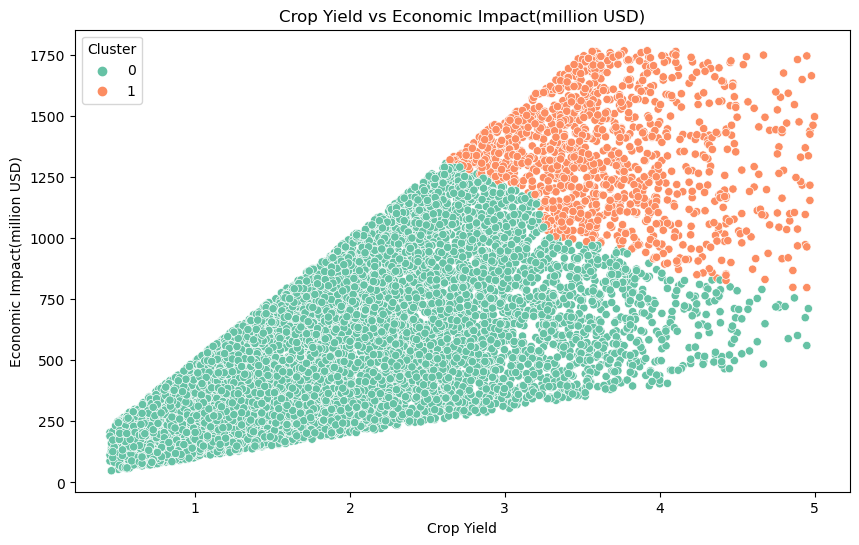

In [36]:
visualise_result('Birch_Cluster')

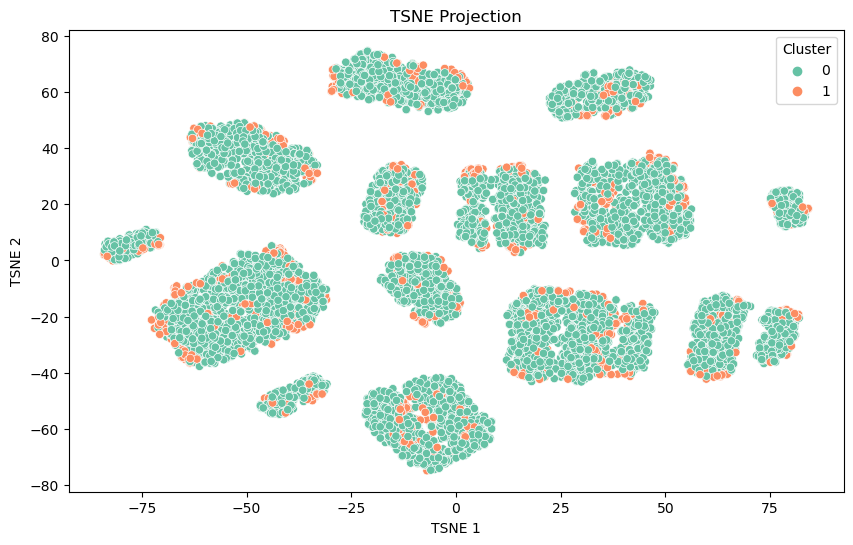

In [37]:
plot_tsne("Birch_Cluster")

## 6) Dirichlet Process Mixture Models (DPMMs)

In [38]:
from sklearn.mixture import BayesianGaussianMixture

def objective_dpmm(trial):
    #parameter range
    n_components = trial.suggest_int("n_components", 2, 5)  # Number of mixture components
    weight_concentration_prior = trial.suggest_float("weight_concentration_prior", 0.001, 1.0, log=True)

    dpmm = BayesianGaussianMixture(n_components=n_components, 
                                   weight_concentration_prior=weight_concentration_prior, 
                                   covariance_type="full", 
                                   random_state=42)
    cluster_labels = dpmm.fit_predict(X)

    # Ensure at least two clusters exist
    unique_labels = set(cluster_labels)
    if len(unique_labels) < 2:
        return -1  # Avoid bad configurations

    return silhouette_score(X, cluster_labels)

# Optimize with Optuna
#tune based on maximizing silhouette score
study_dpmm = optuna.create_study(direction="maximize")
study_dpmm.optimize(objective_dpmm, n_trials=10)

# Train the best model
best_params_dpmm = study_dpmm.best_params
best_dpmm = BayesianGaussianMixture(**best_params_dpmm, covariance_type="full", random_state=42)
df_cluster['DPMM_Cluster'] = best_dpmm.fit_predict(X)

print(f"Best DPMM Params: {best_params_dpmm}")


[I 2025-04-09 11:09:14,904] A new study created in memory with name: no-name-f028f666-4c96-42f2-8275-16743575e446
C:\Users\yeoh9\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:270: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
[I 2025-04-09 11:09:16,735] Trial 0 finished with value: 0.31038513317017746 and parameters: {'n_components': 3, 'weight_concentration_prior': 0.003919438694651121}. Best is trial 0 with value: 0.31038513317017746.
C:\Users\yeoh9\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:270: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
[I 2025-04-09 11:09:18,574] Trial 1 finished with value: 0.31038513317017746 and parameters: {'n_components': 3, 'weight_concentration_prior': 0.042011945260246576}. Best is tri

Best DPMM Params: {'n_components': 2, 'weight_concentration_prior': 0.05549481844194967}


In [39]:
evaluate_cluster('DPMM_Cluster')

Silhouette Score: 0.4056
Calinski Harabasz Score: 9563.6548
Davies_bouldin_score: 0.7883


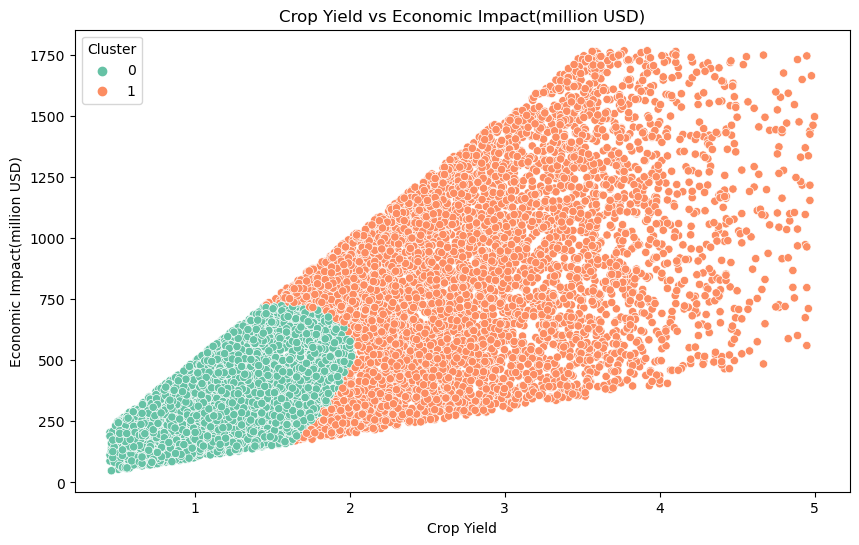

In [40]:
visualise_result('DPMM_Cluster')

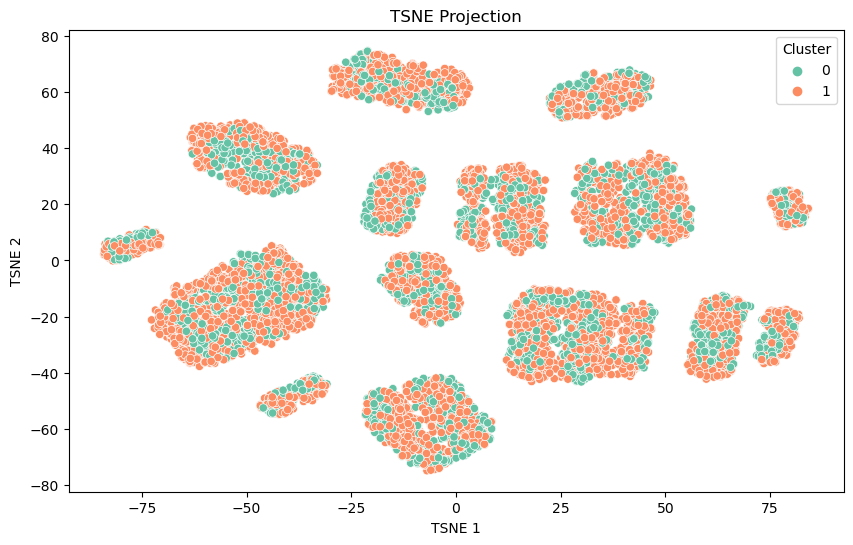

In [41]:
plot_tsne("DPMM_Cluster")

# Insights

In [17]:
result = df_clean.copy()
result['cluster'] = df_cluster['GMM_Cluster']
result

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD,cluster
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13,0
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22,0
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96,0
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32,1
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2022,France,Nouvelle-Aquitaine,Cotton,30.48,685.93,17.64,3.033,9,27.56,41.96,10.95,43.41,No Adaptation,1483.06,1
9996,1999,Australia,Queensland,Soybeans,9.53,2560.38,10.68,2.560,4,77.02,5.45,82.32,59.39,No Adaptation,829.61,1
9997,2000,Argentina,Patagonia,Coffee,31.92,357.76,26.01,1.161,10,78.53,11.94,26.00,41.46,Water Management,155.99,0
9998,1996,Brazil,Southeast,Soybeans,13.95,1549.52,17.31,3.348,2,42.65,44.71,25.07,75.10,Crop Rotation,1613.90,1


## Cluster count

In [18]:
cluster_counts = result['cluster'].value_counts().sort_index()
print("\nNumber of data points in each cluster:")
for i, count in cluster_counts.items():
    print(f"Cluster {i}: {count} points")


Number of data points in each cluster:
Cluster 0: 6511 points
Cluster 1: 3312 points


## Cluster distibution by region


Cluster distribution by Region:


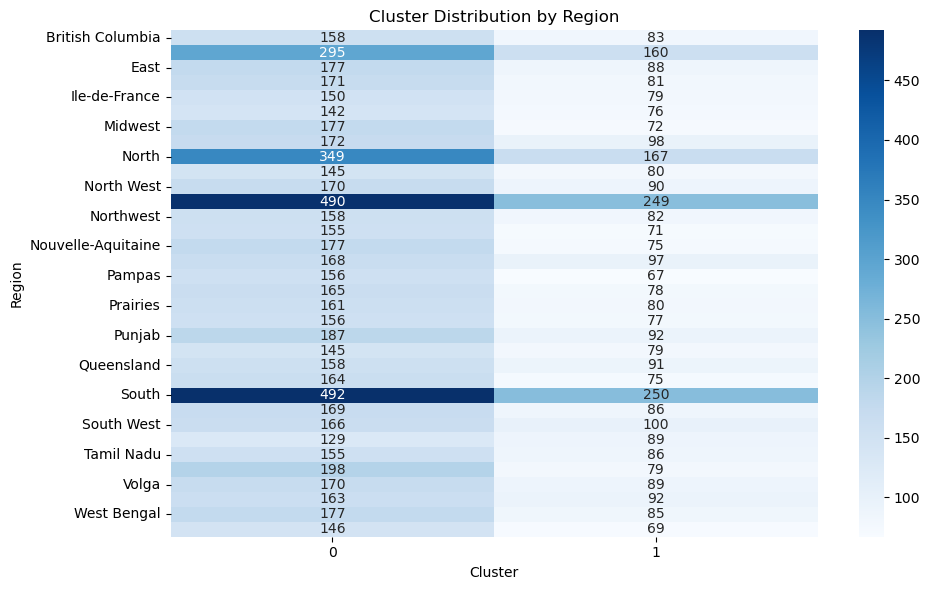

In [21]:
print("\nCluster distribution by Region:")
region_cluster = result.groupby(['Region', 'cluster']).size().unstack().fillna(0)

plt.figure(figsize=(10, 6))
sns.heatmap(region_cluster, annot=True, fmt='g', cmap='Blues')
plt.title('Cluster Distribution by Region')
plt.xlabel('Cluster')
plt.ylabel('Region')
plt.tight_layout()
plt.show()

## Top 10 country cluster distibution


Top 10 countries by cluster distribution:


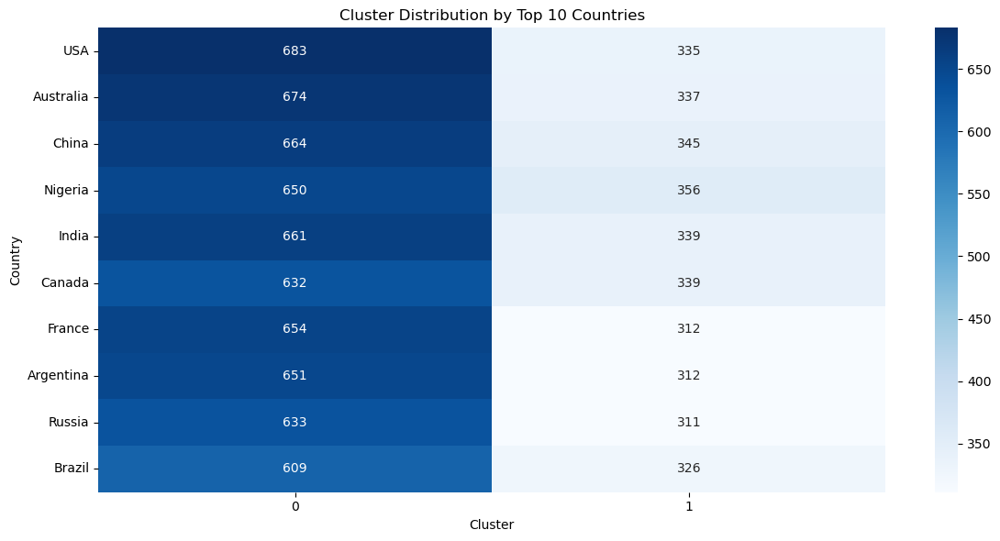

In [23]:
country_cluster = result.groupby(['Country', 'cluster']).size().unstack().fillna(0)
top_countries = country_cluster.sum(axis=1).sort_values(ascending=False).head(10).index

top_10_cluster = country_cluster.loc[top_countries]

plt.figure(figsize=(12, 6))
sns.heatmap(top_10_cluster, annot=True, fmt='g', cmap='Blues')
plt.title('Cluster Distribution by Top 10 Countries')
plt.xlabel('Cluster')
plt.ylabel('Country')
plt.tight_layout()
plt.show()


## Trend of number of cluster 

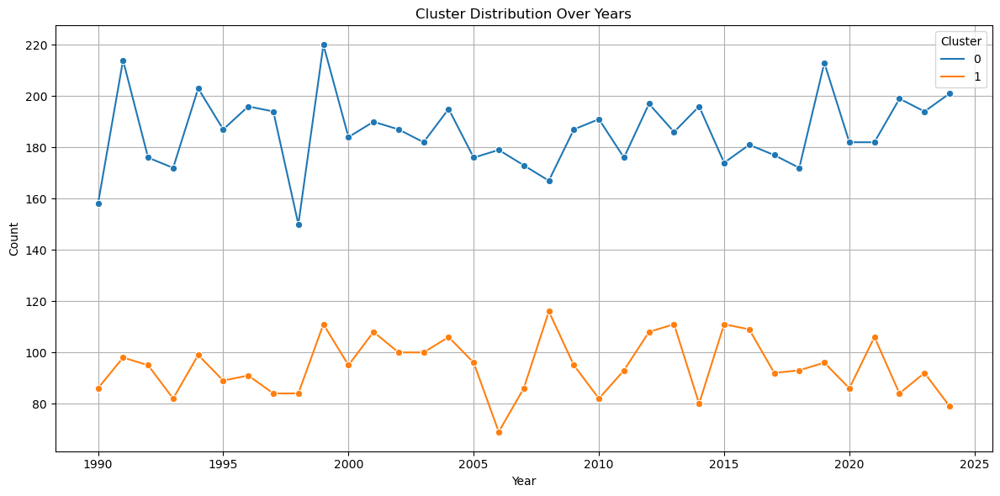

In [38]:
yearly_trend = result.groupby(['Year', 'cluster']).size().unstack(fill_value=0)
yearly_trend_reset = yearly_trend.reset_index().melt(id_vars='Year', var_name='Cluster', value_name='Count')

plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_trend_reset, x='Year', y='Count', hue='Cluster', marker='o')
plt.title('Cluster Distribution Over Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

## CO₂ Emissions vs Temperature by Cluster across Time Bins

C:\Users\yeoh9\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


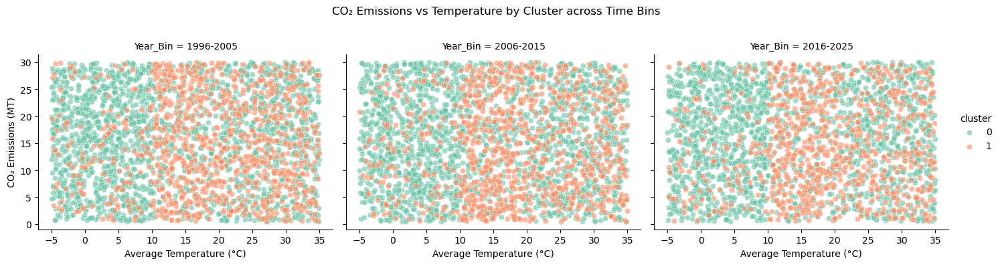

In [55]:
# Optional: Bin years to reduce number of subplots (e.g., by decade)
result['Year_Bin'] = pd.cut(result['Year'], bins=[1995, 2005, 2015, 2025], labels=['1996-2005', '2006-2015', '2016-2025'])

g = sns.FacetGrid(result, col='Year_Bin', hue='cluster', palette='Set2', height=4, aspect=1.2)
g.map_dataframe(sns.scatterplot, x='Average_Temperature_C', y='CO2_Emissions_MT', alpha=0.6)
g.add_legend()
g.set_axis_labels("Average Temperature (°C)", "CO₂ Emissions (MT)")
g.fig.subplots_adjust(top=0.8)
g.fig.suptitle("CO₂ Emissions vs Temperature by Cluster across Time Bins")
plt.show()


## Dominant cluster of eaach region over time

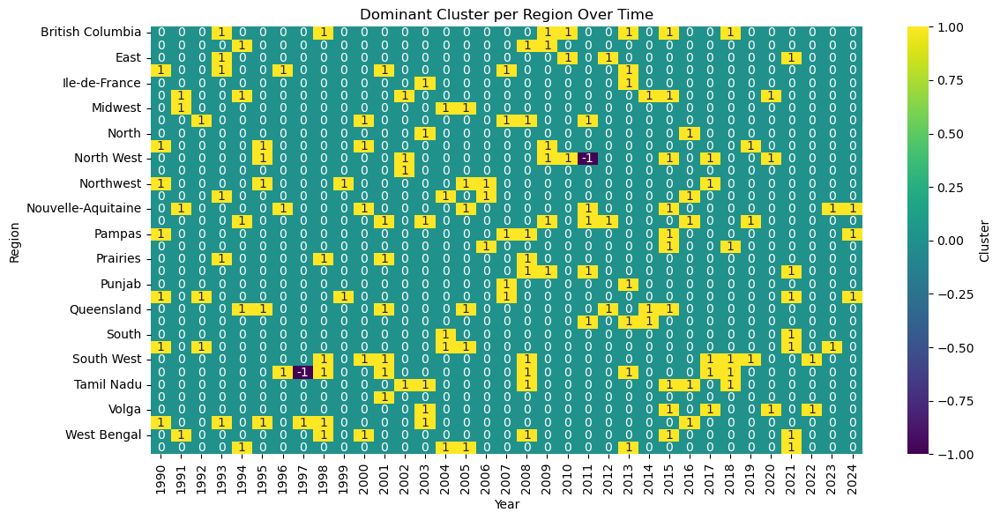

In [39]:
# Check how each region changes cluster over time
region_year_cluster = result.groupby(['Region', 'Year'])['cluster'].apply(lambda x: x.mode()[0])
dominant_cluster = region_year_cluster.unstack().fillna(-1)

plt.figure(figsize=(12, 6))
sns.heatmap(dominant_cluster, annot=True, fmt='.0f', cmap='viridis', cbar_kws={'label': 'Cluster'})
plt.title('Dominant Cluster per Region Over Time')
plt.xlabel('Year')
plt.ylabel('Region')
plt.tight_layout()
plt.show()


## Number of cluster of each region in a country

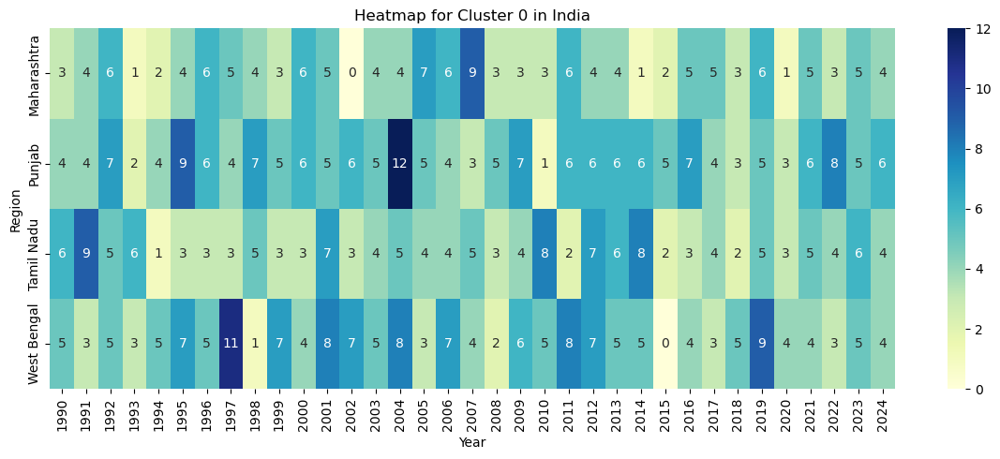

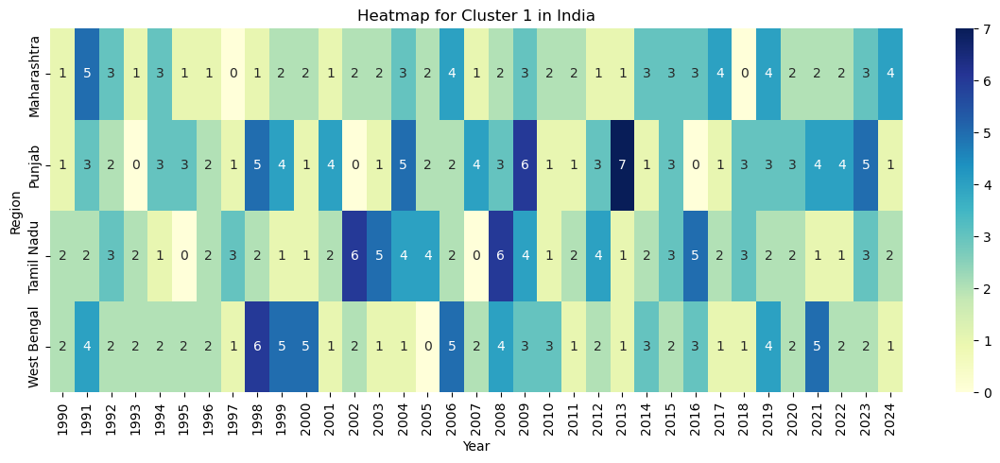

In [35]:
country_name = 'India'
country_cluster = result[result['Country'] == country_name][['Year', 'Region', 'cluster']].sort_values('Year')
country_cluster

# Group and count each cluster per Region-Year
cluster_group = country_cluster.groupby(['Year', 'Region', 'cluster']).size().reset_index(name='count')

# Get unique cluster values
unique_clusters = cluster_group['cluster'].unique()

# Create a heatmap for each cluster
for cl in unique_clusters:
    cluster_data = cluster_group[cluster_group['cluster'] == cl]
    pivot = cluster_data.pivot(index='Region', columns='Year', values='count').fillna(0)

    plt.figure(figsize=(12, 5))
    sns.heatmap(pivot, annot=True, fmt='g', cmap='YlGnBu')
    plt.title(f"Heatmap for Cluster {cl} in {country_name}")
    plt.xlabel("Year")
    plt.ylabel("Region")
    plt.tight_layout()
    plt.show()




## Which year the number of cluster peaked

In [40]:
print("\nTemporal insights:")
# Example: Years when certain clusters became dominant
for cluster in sorted(result['cluster'].unique()):
    dominant_years = yearly_trend[yearly_trend[cluster] == yearly_trend[cluster].max()].index.tolist()
    print(f"- Cluster {cluster} peaked in {dominant_years}")



Temporal insights:
- Cluster 0 peaked in [1999]
- Cluster 1 peaked in [2008]


In [37]:
numeric_columns = df.select_dtypes(include=['number']).columns
numeric_columns = numeric_columns.tolist()
numeric_columns.append('cluster')





cluster,0,1
Year,2007.076179,2007.028986
Average_Temperature_C,13.431368,18.695374
Total_Precipitation_mm,1596.727282,1636.842277
CO2_Emissions_MT,15.674661,14.484647
Crop_Yield_MT_per_HA,1.692157,3.209638
Extreme_Weather_Events,4.988020,4.968297
Irrigation_Access_%,55.238028,55.125371
Pesticide_Use_KG_per_HA,24.956802,24.895574
Fertilizer_Use_KG_per_HA,49.877976,50.102539
Soil_Health_Index,64.849980,64.940127


## Compare mean between clusters

In [41]:
mean_result = result[numeric_columns].groupby('cluster').mean().T
mean_result


cluster,0,1
Year,2007.076179,2007.028986
Average_Temperature_C,13.431368,18.695374
Total_Precipitation_mm,1596.727282,1636.842277
CO2_Emissions_MT,15.674661,14.484647
Crop_Yield_MT_per_HA,1.692157,3.209638
Extreme_Weather_Events,4.988020,4.968297
Irrigation_Access_%,55.238028,55.125371
Pesticide_Use_KG_per_HA,24.956802,24.895574
Fertilizer_Use_KG_per_HA,49.877976,50.102539
Soil_Health_Index,64.849980,64.940127


## Compare standard deviation between clusters

In [53]:
var_result = result[numeric_columns].groupby('cluster').std().T
var_result

cluster,0,1
Year,10.152419,9.959799
Average_Temperature_C,12.078885,9.485437
Total_Precipitation_mm,815.051281,787.536473
CO2_Emissions_MT,8.541124,8.642764
Crop_Yield_MT_per_HA,0.660419,0.631913
Extreme_Weather_Events,3.165265,3.164840
Irrigation_Access_%,25.957683,26.015185
Pesticide_Use_KG_per_HA,14.499494,14.487516
Fertilizer_Use_KG_per_HA,28.734346,28.710126
Soil_Health_Index,20.194990,20.208252


In [44]:
clus_0 = result[result['cluster']==0]
clus_1 = result[result['cluster']==1]

In [47]:
def pie_chart(df, col, axes, clusterno):
    s= clusterno+ ' '+col
    cnts = df[col].value_counts()
    axes.pie(cnts, labels=cnts.index, autopct='%.1f%%', startangle=90, colors=sns.color_palette('colorblind'))
    axes.set_title( s.upper(), fontsize=14, fontweight='bold')

def bar_plt(df, col, axes, clusterno):
    s= clusterno+ ' '+col
    cnts = df[col].value_counts()
    bars = axes.bar(cnts.index, cnts.values)
    axes.bar_label(bars)
    axes.set_title(s.upper(), fontsize=14, fontweight='bold')
    axes.get_yaxis().set_visible(False)
    axes.set_xlabel(col)

## Summary info on country and region cluster distribution

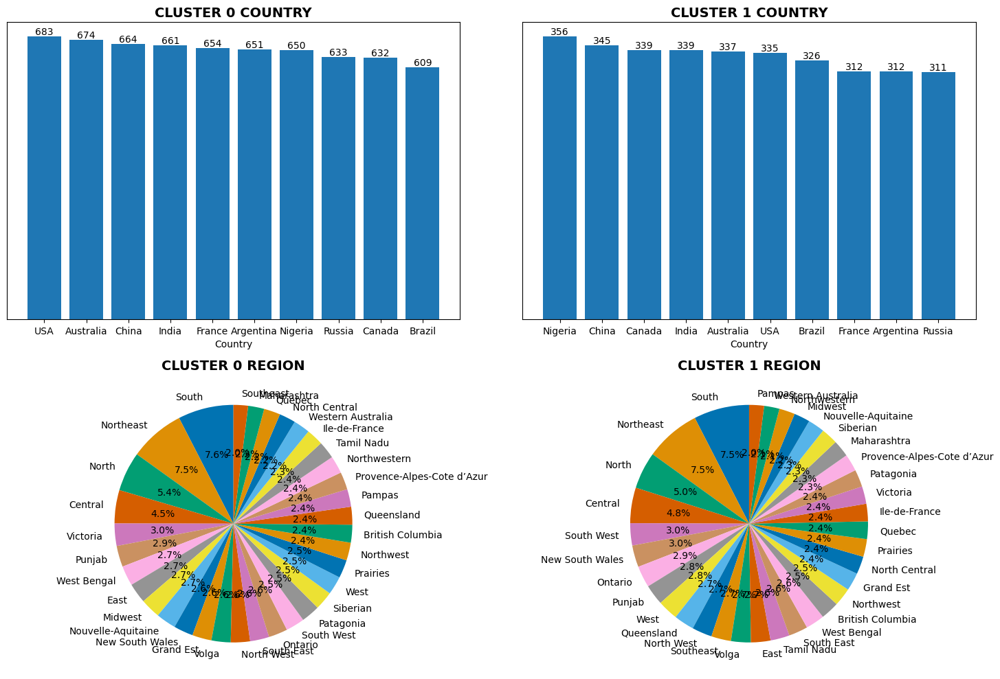

In [48]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
bar_plt(clus_0, 'Country', axes[0,0], 'cluster 0')
bar_plt(clus_1, 'Country', axes[0,1], 'cluster 1')

pie_chart(clus_0, 'Region', axes[1,0], 'cluster 0')
pie_chart(clus_1, 'Region', axes[1,1], 'cluster 1')

plt.tight_layout()
plt.show()

## Crop type of each cluster

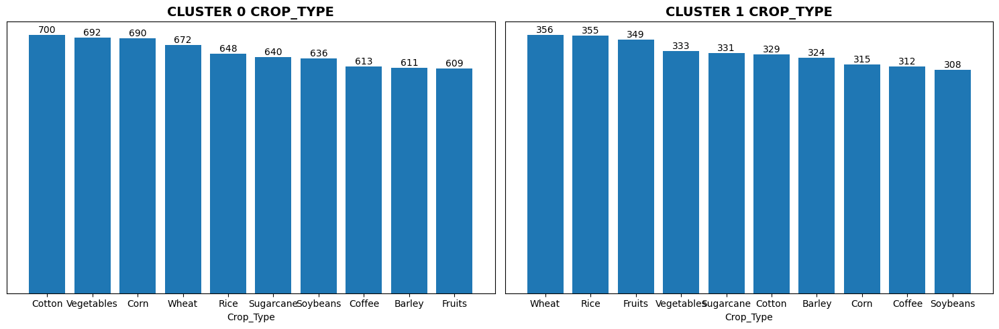

In [50]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
bar_plt(clus_0, 'Crop_Type', axes[0], 'cluster 0')
bar_plt(clus_1, 'Crop_Type', axes[1], 'cluster 1')

plt.tight_layout()
plt.show()

## Adaption Strategy of each cluster

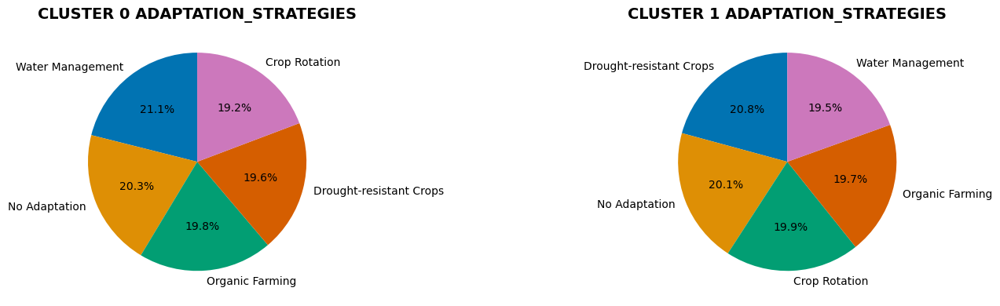

In [51]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
pie_chart(clus_0, 'Adaptation_Strategies', axes[0], 'cluster 0')
pie_chart(clus_1, 'Adaptation_Strategies', axes[1], 'cluster 1')

plt.tight_layout()
plt.show()

# Deploy Best Model

In [19]:
import joblib

try:
    joblib.dump(best_gmm, "gmm.pkl")
    print("Saved successfully")
except: 
    print("Failed")


        

# # joblib.dump(scaler, "scaler.pkl")
# # print("✅ Scaler saved successfully!")

# joblib.dump(X_tsne, "tsne.pkl")
# print("✅ t-SNE saved successfully!")

# # models = [best_gmm, best_optics, best_hdbscan, best_bkm, best_birch, best_dpmm]
# # modelName = ["best_gmm", "best_optics", "best_hdbscan", "best_bkm", "best_birch", "best_dpmm"]

# # for model, name in zip(models, modelName):
# #     joblib.dump(model, f"{name}_model.pkl")
# #     print(f"{name} saved successfully!")

Saved successfully


cd C:\Users\yeoh9\OneDrive\Desktop\Machine Learning\ML Assignment

In [ ]:
cd C:\Users\yeoh9\OneDrive\Desktop\mlhelp